In [3]:
import pandas as pd #import pandas library
import matplotlib.pyplot as plt
from scipy.io.wavfile import read
from scipy import signal
import numpy as np
from IPython.display import Audio
#Those having librosa issues will need help ASAP!!
from librosa import feature, load

# Key finding from Audio

Before we dive into the math and code, let’s ask: **Why do we care about key detection in music?**

Key detection helps us:
- Identify the tonal center of a piece (i.e., Key Detection)
- Enable harmonic analysis or chord labeling.
- Aid music recommendation systems (e.g. matching similar keys).
- Assist in automatic transcription and genre analysis.
- Normalize or compare pieces across datasets.
- Useful for many plugins and softwares (e.g., DJ software, DAWs, etc.)

It's a fundamental part of **Music Information Retrieval (MIR)** and connects signal processing to human perception.




### Understanding Distributions and Correlation

### Correlation

A correlation tests the strength of the relationship between two variables. Several types of correlation procedures exist, each with their own resulting coefficient based on their respective definitions. However, all correlation coefficients return values in the range from −1 to +1, where +1 is perfect correlation in the same direction, -1 is perfect correlation in opposite directions, and 0 means absolutely no relationship.

Let's look at some athlete data to do some examples:

We will start learning how to use the `pandas` library. For now, you can just follow along with the comments:

In [4]:
df = pd.read_csv('../Datasets/ais.csv') # function to read table data (i.e., comma separated value or .csv files)
df.head() # show first 5 rows of the table

,Unnamed: 0,rcc,wcc,hc,hg,ferr,bmi,ssf,pcBfat,lbm,ht,wt,sex,sport
0,1,3.96,7.5,37.5,12.3,60,20.56,109.1,19.75,63.32,195.9,78.9,f,B_Ball
1,2,4.41,8.3,38.2,12.7,68,20.67,102.8,21.30,58.55,189.7,74.4,f,B_Ball
2,3,4.14,5.0,36.4,11.6,21,21.86,104.6,19.88,55.36,177.8,69.1,f,B_Ball
3,4,4.11,5.3,37.3,12.6,69,21.88,126.4,23.66,57.18,185.0,74.9,f,B_Ball
4,5,4.45,6.8,41.5,14.0,29,18.96,80.3,17.64,53.20,184.6,64.6,f,B_Ball


#### Example: Athlete Data

The above table shows statistical data for a set of athletes. While the columns are not labeled in a way that we can understand, there are several columns that are pretty easy to guess: "ht" = height, "wt" = weight, "bmi" is body mass index, "pcBfat" is percent body fat, etc.

Perhaps we would want to know how tightly correlated the values for weight and height are. A good way to visualize this is by graphing first. We'll make use of the function `pandas.DataFrame.plot.scatter`

Text(0, 0.5, 'Height')

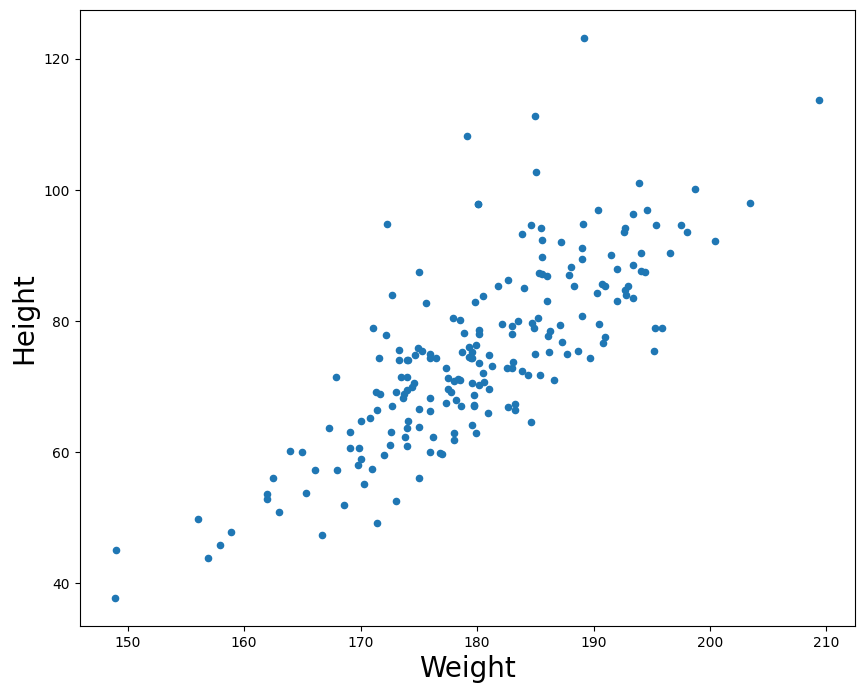

In [5]:
p = df.plot.scatter(x ='ht', y = 'wt', figsize=(10,8))
p.set_xlabel('Weight', fontsize=20)
p.set_ylabel('Height', fontsize=20)

For every value in height (x-axis) we plot the athlete's respective weight on the y-axis.

There are two types of correlations: positive and negative. When two factors are positively correlated, it means that as one variable increases, the other also increases. In this example, we can see that as a person's height in cm increases, their weight also tends to increase. **If there was a *perfect* correlation, we could draw a straight line and all points would sit exactly on the line.** This is because a perfect correlation means that for every increase in some value on the X axis, we have an exact predicted value of change on the Y axis.

If the reverse relationship is true, then we call it a negative correlation (one factor goes up as the other systematically goes down.) Note a perfect *negative* correlation still results in a straight line. The line would simply descend instead of ascend. The point is that the relationship between two variables can be perfectly predicted either way.

**In both cases, when there is a strong correlation (either positive OR negative), movement along one variable strongly predicts movement along another.**

#### Pearson’s Product-Moment Correlation

The most common measure of correlation is Pearson’s product-moment correlation, which is commonly referred to simply as "the correlation", "the correlation coefficient", or just the letter *r* (always written in italics).

    * A correlation coefficient (r value) of 1 indicates a perfect positive correlation.
    * A correlation of -1 indicates a perfect negative correlation.
    * A correlation of 0 indicates that there is no relationship between the two variables.
    
Therefore, absolute values between 0 and 1 denote the strength of the correlation, and the direction of the value (positive or negative) indicate the direction of the correlation or relationship between the variables.

`numpy.corrcoef` is a function for computing the Pearson product-moment correlation coefficient. It actually returns a matrix, which represents the coefficient for all possible combinations of the variables. For example, if passed two arrays, *X* and *Y*, it will output four values, representing:

Cov( X, X ), Cov( X, Y )
Cov( Y, X ), Cov( Y, Y )

("Cov" stands for covariance).

Since what we care about is the relation between X and Y, we can ignore the X-X and Y-Y comparisons. The other two vaules will be the same.

The pandas library also has a built-in function if you are already using dataframe structures (like our example above which we will soon go over) `pandas.DataFrame.corr` which does the same thing as the numpy function. 

In [6]:
#Compute the correlation coefficient between the athletes' height and weight
df[['ht','wt']].corr() #subset the dataframe to only look at height and weight columns; pass to correlation function

,ht,wt
ht,1.000000,0.780932
wt,0.780932,1.000000


**Reminder**: A correlation close to +1 or -1 means a strong relationship.
We’ll use this same concept to **match pitch content (note distributions) to key templates**.


We can look at two other (nonsensical) features to examine any possible correlation

<AxesSubplot: xlabel='ssf', ylabel='lbm'>

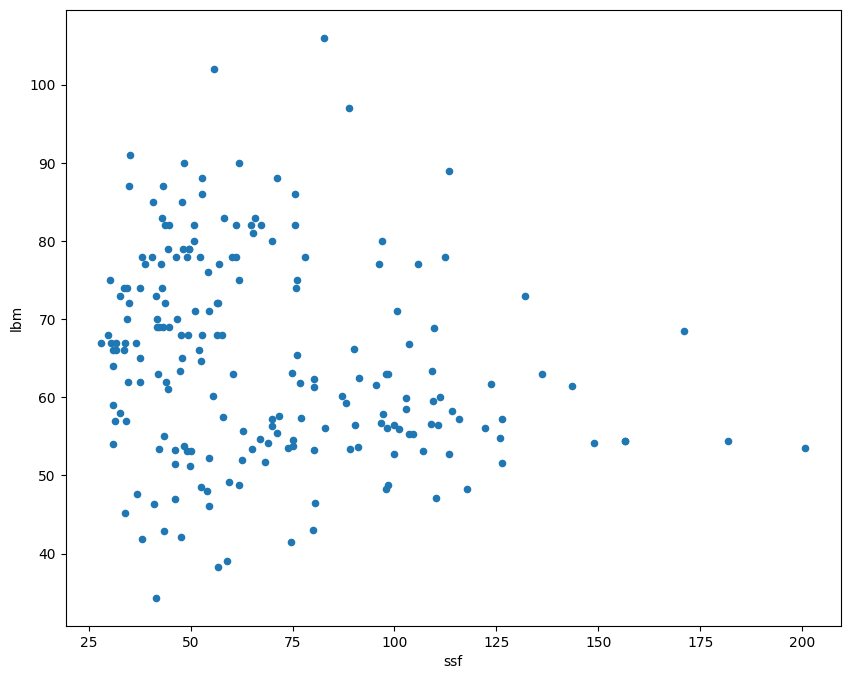

In [7]:
df.plot.scatter(x ='ssf', y = 'lbm', figsize=(10,8))

In [8]:
df[['ssf','lbm']].corr()

,ssf,lbm
ssf,1.000000,-0.207749
lbm,-0.207749,1.000000


The above represents an example of a weak negative correlation between the factors ssf(?) and lbm (lean body mass?) with an *r* value of -0.2 (common practice is to round to 1 or 2 decimal places).

### Note Distributions and Key Profiles


I'm switching to using Librosa to read in the files, since if working with 'real' audio files it has built-in parameters that make it easier to include in a data-processing pipeline. Namely, the ability to downsample and convert to mono at the time of read-in.

**Note: Librosa's load outputs a tuple that is backwards from `scipy.io.wavfile.read`, that is, it outputs (data, sr)**

In [9]:
# load default is sr=22050, and convert to mono = True
(x, fs) = load('../audio/JimHendrix_HeyJoe.wav') 
fs

22050

In [10]:
xn = x/np.abs(x.max()) #normalize
dur = len(xn)/fs
t = np.arange(0, dur, 1/(fs))/60 #time in minutes

It's common practice when examining spectral content for large quantities of analysis to **downsample by half (so go from 44.1 to 22.05 kHz).** This reduces the overall amount of processing by 1/2. In this case, the Nyquist will be ~11kHz which still has most music data we need and doesn't impact overall results much. Note that `librosa` has it's own `load` function which does this downsampling automatically. (More on that later.)

Text(0.5, 0, 'Time in minutes')

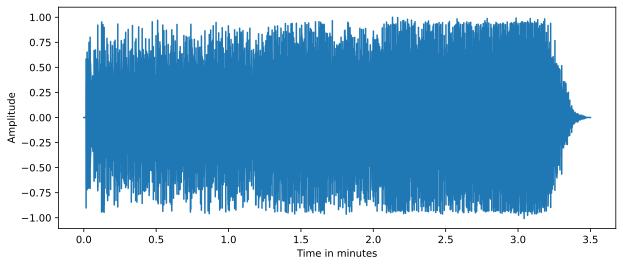

In [11]:
#Sample song

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

plt.figure(figsize=(10,4))
plt.plot(t, xn)
plt.ylabel('Amplitude')
plt.xlabel('Time in minutes')

In [12]:
Audio(xn, rate=fs)

### Key Finding Steps

##### 1) Create a Chromagram
Get chromagram for first 30 seconds of audio

In [13]:
chromagram = feature.chroma_stft(y = xn[:fs*30], n_fft=1024) #sr*15 = first fifteen seconds worth of samples
chromagram

array([[0.8431325 , 0.621215  , 0.684881  , ..., 0.16595522, 0.30649003,
        0.20199537],
       [0.722546  , 0.7780189 , 0.7037723 , ..., 0.2693255 , 0.2576989 ,
        0.19934118],
       [0.967982  , 1.        , 1.        , ..., 0.52050334, 0.37446037,
        0.37337697],
       ...,
       [0.5319908 , 0.5301151 , 0.46931523, ..., 0.1461906 , 0.36337835,
        0.12319843],
       [0.64986813, 0.5611799 , 0.93825793, ..., 0.12136692, 0.26087835,
        0.11392853],
       [0.80310094, 0.65570176, 0.89677703, ..., 0.13269301, 0.36876604,
        0.2350811 ]], dtype=float32)

In [14]:
chromagram.shape

(12, 1292)

Recall that the chromagram will output a multidimensional array: here with 1292 time windows each with a vector of 12 values (one for the magnitude of each pitch class). The chromagram output vector is arranged from 0 to 12 where 0='C'

##### 2) Take the Mean Chroma values for each of the 12 bins

Text(0, 0.5, 'Energy')

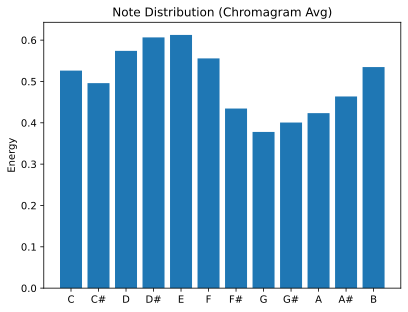

In [15]:
avg = chromagram.mean(axis=1)

scaledegs = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
plt.bar(scaledegs, avg)
plt.title("Note Distribution (Chromagram Avg)")
plt.ylabel("Energy")

### Segue: What do we compare our song's output to? (Enter: "Key Profiles")
The most common key-finding procedure is that chromagrams are computed from some file or excerpt, and each chromagram is evaluated against some kind of pitch class distributions (usually also called "key profiles" or "pitch class profiles" or "theoretical profiles" for all 24 musical (major-minor) keys. The one below has averaged all major and minor keys respectively and represents scale-degree rather than chroma.

#### Krumhansl-Kessler Key Profiles (i.e., "KK profiles")
Krumhansl and Kessler did a famous study in the 80s, and their profiles are still one of the most widely-used today. They are widely used because they are one of the only set of values  **based on human perception.**  

The basic idea was that, over several experiments, they asked people to rate how well a particular note "fit" following a particular cadential chord progression. The "profile" then, is the averaged ratings by chromatic scale degree (see below).

These profiles have been shown to be highly correlated with actual pitch class distributions for classical pieces. (I.e., if we count up all the notes in a Mozart sonata in C major, and report the distribution of scale-degrees as a proportion, the shape would look a lot like the profile on the left).

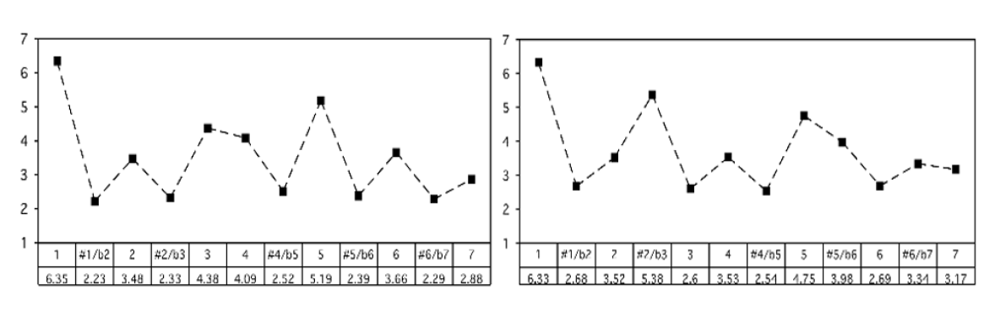

In [16]:
from IPython.display import Image
Image('../images/kk_profiles.png', embed=True)
#Major profile on left, Minor profile on right

In [17]:
#profile values by pitch class
#CMajor:
major_0 = np.array([6.35,2.23,3.48,2.33,4.38,4.09,2.52,5.19,2.39,3.66,2.29,2.88]) #values: C,C#,D,D#,...B
#CMinor:
minor_0 = np.array([6.33,2.68,3.52,5.38,2.60,3.53,2.54,4.75,3.98,2.69,3.34,3.17]) #values: C,C#,D,D#,...B

We can plot each of these as a histogram... 

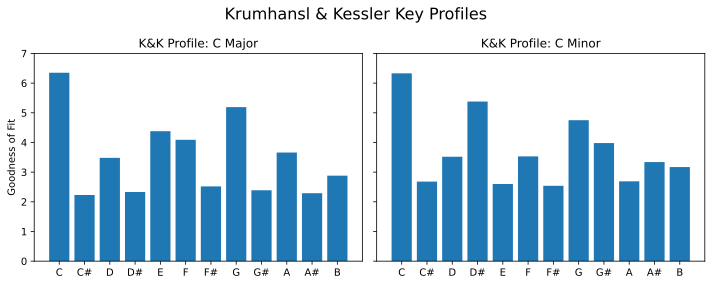

In [18]:
scaledegs = ['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']

fig, ax = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

ax[0].bar(scaledegs, major_0)
ax[0].set_title("K&K Profile: C Major")
ax[0].set_ylim((0, 7))
ax[0].set_ylabel("Goodness of Fit")

ax[1].bar(scaledegs, minor_0)
ax[1].set_title("K&K Profile: C Minor")
ax[1].set_ylim((0, 7))

fig.suptitle("Krumhansl & Kessler Key Profiles", fontsize=16)
plt.tight_layout()
plt.show()

Notice that for chromatic notes we typically just show all sharps or all flats for simplicity, even though **they are enharmonic equivalents.** To get the "pitch class profile" values for every major key, we need to shift (or rotate) all the chromatic values by 1 semitone. (E.g., C# major will have "do" equal to "C#")

In [23]:
# Create a separate array (i.e. "profile") for every major and minor key
profiles_major = np.array(
    [np.roll(major_0, i) for i in range(12)]
)

profiles_minor = np.array(
    [np.roll(minor_0, i) for i in range(12)]
)

# stack the two arrays:
all_keys = np.vstack([profiles_major, profiles_minor])


In [24]:
# we can optionally name the keys for keeping track & later use:
key_order = ['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']
key_labels = [i + " major" for i in scaledegs] + [i + " minor" for i in scaledegs]
key_labels


['C major',
 'C# major',
 'D major',
 'D# major',
 'E major',
 'F major',
 'F# major',
 'G major',
 'G# major',
 'A major',
 'A# major',
 'B major',
 'C minor',
 'C# minor',
 'D minor',
 'D# minor',
 'E minor',
 'F minor',
 'F# minor',
 'G minor',
 'G# minor',
 'A minor',
 'A# minor',
 'B minor']

Let's see a plot of a few so we see what we are doing:

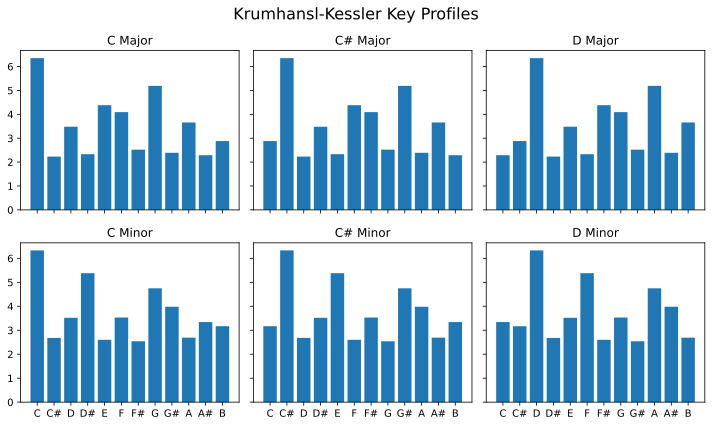

In [25]:
# Set up the figure to plot the profiles
fig, ax = plt.subplots(2, 3, sharex='col', sharey='row', figsize=(10,6))  # 2 rows and 6 columns


# Plot the major key profiles in the first row (indices 0 to 11)
for i in range(3):
    ax[0, i].bar(scaledegs, all_keys[i])  # Get the i-th major key profile (rows 0-11)
    ax[0, i].set_title(scaledegs[i] + " Major")

# Plot the minor key profiles in the second row (indices 12 to 23)
for i in range(3):
    ax[1, i].bar(scaledegs, all_keys[i + 12])  # Get the i-th minor key profile (rows 12-23)
    ax[1, i].set_title(scaledegs[i] + " Minor")

# Add title and adjust layout for subplots
fig.suptitle('Krumhansl-Kessler Key Profiles', fontsize=16)
plt.tight_layout()  

By creating a separate array for each possible major scale, we can then take the values we have computed from our chromagrams and calculate correlations with each of the 24 profiles to estimate which one is the best match.

<BarContainer object of 12 artists>

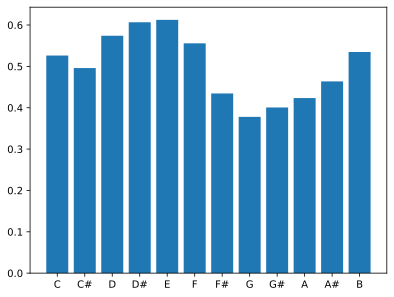

In [26]:
#Recall that our file's average chroma looked like this:
plt.bar(scaledegs, avg)

##### 3) Compute correlation between song's average chroma & each key "profile" looking for maximum positive correlation

Since `all_keys` is a 24x12 matrix (24 keys, each with 12 values representing the pitch classes), we can compute the correlation between the averaged chromagram (`avg` object) and each key profile using vectorized operations, where our object gets compared to each key (row) of the matrix one at a time:

In [32]:
#Compute correlation between these values and each possible vector from the array dictionary.
# recall how np.corrcoef gives 4 values; we therefore index, [0,1], to return the one value we want.
correlations = np.array([
    np.corrcoef(avg, row)[0, 1] for row in all_keys
])

for label, corr in zip(key_labels, correlations):
    print(label + ": " + str(round(corr, 3)))

C major: 0.055
C# major: -0.22
D major: -0.118
D# major: 0.007
E major: 0.146
F major: 0.086
F# major: -0.189
G major: -0.112
G# major: -0.05
A major: 0.051
A# major: 0.163
B major: 0.18
C minor: 0.092
C# minor: 0.056
D minor: 0.22
D# minor: 0.181
E minor: 0.164
F minor: -0.026
F# minor: -0.297
G minor: -0.279
G# minor: -0.054
A minor: 0.036
A# minor: -0.125
B minor: 0.031


The highest positive correlation is .22 for D minor, followed by Eb minor at ".18.
The problem is, humans don't really agree on the key for 'Hey Joe'. The song's chord progression follows an ascending circle-of-fifths using only major harmonies: CM - GM - DM - AM -EM.  Because it tends to cadence on E, people most commonly say the piece is in E major. 

The correlation with E major is 0.14, which is the fourth-best guess according to this simple model (E minor gets score of .16).

#### Another try

Compute the chromagram for "Eleanor Rigby" for the first 30 seconds

In [29]:
(x, fs) = load('../audio/eleanorrigby.wav', sr=22050)

xnorm = x/np.abs(x.max())

In [30]:
from IPython.display import Audio
Audio(xnorm, rate=fs)

In [31]:
chromagram = feature.chroma_stft(y = xnorm[:30*fs], n_fft=2048) #first 30 seconds only
avg2 = chromagram.mean(axis=1)# Take average chromagram values for entire duration of clip (i.e. across rows)

correlations2 = np.array([
    np.corrcoef(avg2, row)[0, 1] for row in all_keys
])

for label, corr in zip(key_labels, correlations2):
    print(label + ": " + str(round(corr, 3)))

C major: 0.476
C# major: -0.579
D major: -0.039
D# major: -0.136
E major: 0.521
F major: -0.13
F# major: -0.38
G major: 0.509
G# major: -0.301
A major: -0.011
A# major: -0.274
B major: 0.343
C minor: 0.123
C# minor: -0.008
D minor: -0.264
D# minor: -0.263
E minor: 0.924
F minor: -0.192
F# minor: -0.406
G minor: -0.027
G# minor: 0.221
A minor: 0.209
A# minor: -0.597
B minor: 0.28


This piece has the highest positive correlation with E minor at .92, followed by E major at .51, followed by G major at .51.  Most people agree this piece is in E minor (though given the melody, it might better be described as in E dorian, which is the same as the natural minor with a raised 6th! Yet another problem for popular music...)

### Testing different systems

It is possible that we might get better results if we examined the *last* thirty seconds of a song (this would be especially true for classical music).

An alternative system might break down the song into several slices of, say, 10 to 30 seconds each and compute the average of the chromagram for that duration of time.  When there might be a "close tie" for first place, doing it this way would allow the comparison of multiple arrays of r values, and you could then examine the global average in comparison with the highest positive values across each array to examine how many times the highest average value of each time frame aligned with the global average.

In our activity we will try a few different approaches and compare output.

### Testing different possible key profiles
Here we examined only the relation between the chromagram data and the Krumhansl-Kessler profiles. These are strongly biased towards distributions in Western classical music. However, they are the only key profile values in use that are *psychologically collected*. There are other profiles based on the distributions of notes in various data collections that have been tested and may work *slightly* better on popular music. For instance, a profile by David Temperley has been known to do better for pop music.  There are many others, for instance...

In [27]:
from music21 import analysis
a = analysis.discrete.KrumhanslSchmuckler() #These are the same ones we are already using. 
a.getWeights(weightType='major')

[6.35, 2.23, 3.48, 2.33, 4.38, 4.09, 2.52, 5.19, 2.39, 3.66, 2.29, 2.88]

In [28]:
a = analysis.discrete.SimpleWeights() #Super simple weighting based on 3 categories: In triad (2), in diatonic collection (1) or chromatic (0)
a.getWeights(weightType='major')

[2, 0, 1, 0, 1, 1, 0, 2, 0, 1, 0, 1]

In [29]:
a = analysis.discrete.TemperleyKostkaPayne()
a.getWeights(weightType='major')

[0.748, 0.06, 0.488, 0.082, 0.67, 0.46, 0.096, 0.715, 0.104, 0.366, 0.057, 0.4]

In [30]:
a = analysis.discrete.AardenEssen()
a.getWeights(weightType='major')

[17.7661,
 0.145624,
 14.9265,
 0.160186,
 19.8049,
 11.3587,
 0.291248,
 22.062,
 0.145624,
 8.15494,
 0.232998,
 4.95122]

In [31]:
a = analysis.discrete.BellmanBudge()
a.getWeights(weightType='major')

[16.8, 0.86, 12.95, 1.41, 13.49, 11.93, 1.25, 20.28, 1.8, 8.04, 0.62, 10.57]

#### Challenges
There are many reasons that automatic key detection is a non-trivial task for a computer. The biggest challenge for automatic key detection systems is that it can even be a challenging task for humans! For instance, when a piece has changes of the key (modulations) and/or many notes that are outside of the theoretical note distribution of the key, the order and timing of notes becomes very important.

Currently key detection works best for popular music that stays (mostly) within a single key for the duration of the piece, or music where the largest proportion of the song stays in one key. They also tend to work slightly better with a larger window for finer spectral resolution (e.g., fft size =~ 4096-8192) and a fairly large overlap of 50% or higher.

Chromagrams are typically generated with A=440 tuning, and so any recording that deviates from this will need to be adjusted. (See Librosa package details for how to do that!)

**Note: If we wanted to compare different key profiles, it would be wise to normalize each one first!**